<a href="https://colab.research.google.com/gist/sabdha/17f6cf02f30dd169fe0ddb6aacd3ec71/resnet_18_solar_clean_dirty_classification-updated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/Solar_Training.zip

In [ ]:
import os
i=0
for img in os.listdir('/content/test'):   
    os.rename('/content/test/'+img, '/content/test/'+'test'+str(i)+'.jpg')
    i+=1

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import shutil

In [ ]:
#Check and convert each RGBA images to RGB
for i in (os.listdir('/content/drive/MyDrive/CleanPV')):
  if np.array(Image.open('/content/drive/MyDrive/CleanPV'+'/'+str(i))).shape[2] == 4:
    img = Image.fromarray(np.array(Image.open('/content/drive/MyDrive/CleanPV'+'/'+i))).convert('RGB')
    print(np.array(img).shape)
    img.save('/content/drive/MyDrive/CleanPV'+'/'+i)
    img.show()
    print(i)

(627, 1200, 3)
CleanPV-(938).jpg
(600, 2007, 3)
CleanPV-(943).jpg
(452, 680, 3)
CleanPV-(889).jpg
(420, 850, 3)
CleanPV-(908).jpg


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


In [ ]:
for i in (os.listdir('/content/drive/MyDrive/DirtyPV')):
  if np.array(Image.open('/content/drive/MyDrive/DirtyPV'+'/'+str(i))).shape[2] == 4:
    img = Image.fromarray(np.array(Image.open('/content/drive/MyDrive/DirtyPV'+'/'+i))).convert('RGB')
    print(np.array(img).shape)
    img.save('/content/drive/MyDrive/DirtyPV'+'/'+i)
    img.show()
    print(i)

(532, 800, 3)
DirtyPV-(373).jpg


In [ ]:
import os
import cv2
import time
import random
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

import torchvision.transforms as T
from torchvision.utils import make_grid
from torchvision.models import resnet101

from sklearn.model_selection import train_test_split

from PIL import Image
import copy
import matplotlib.pyplot as plt
%matplotlib inline

C:\Users\dhany\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\dhany\anaconda3\lib\site-packages\numpy\.libs\libopenblas.NOIJJG62EMASZI6NYURL6JBKM4EVBGM7.gfortran-win_amd64.dll
C:\Users\dhany\anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [ ]:
DIR_TRAIN = "/content/Solar_Training/"
DIR_TEST = "/content/drive/MyDrive/test_cropped"

In [ ]:
clean = os.listdir("/content/Solar_Training/CleanPV")
dirty = os.listdir("/content/Solar_Training/DirtyPV")[:880]
#test_imgs = os.listdir(DIR_TEST)

In [ ]:
### Creating a list of all images : DIR_TRAIN/class_folder/img.jpg - FOR METHOD 2 of data loading
#   A dict for mapping class labels to index

train_images = []
# valid_imgs = []
# test_imgs = []


#_clas =  os.listdir(DIR_TRAIN)[1:]

clas = ['CleanPV', 'DirtyPV']
for cls in clas:
  #print(cls)
  if cls == 'CleanPV':
    cls = clean
  elif cls == 'DirtyPV':
    cls = dirty
  for img in cls:
        train_images.append(img)
        
# for img in os.listdir(DIR_TEST + _class):
#          test_imgs.append(DIR_TEST + _class + "/" + img)
classes = ['CleanPV', 'DirtyPV']
class_to_int = {classes[i] : i for i in range(len(classes))}

In [ ]:
len(clean)

880

In [ ]:
labels_count = np.asarray([len(clean), len(dirty)])

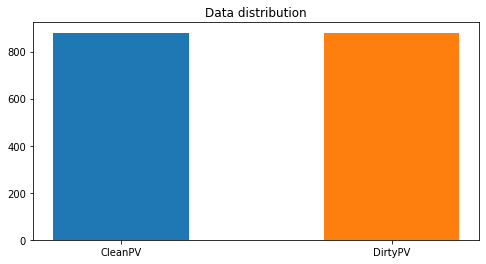

In [ ]:
class_names = classes

plt.figure(figsize=(8, 4))
plt.title('Data distribution')
plt.bar(class_names, labels_count, width=.5, color = ['C0', 'C1'])
plt.show()

In [ ]:
def get_train_transform():
    return T.Compose([
      # T.RandomHorizontalFlip(p=0.5),
      # T.RandomRotation(15),
      #   T.Resize(256),
      #   T.CenterCrop(224),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
   ])
    
def get_val_transform():
    return T.Compose([
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

In [ ]:
class SolarDataset(Dataset):
    
    def __init__(self, imgs, class_to_int, mode = "train", transforms = None):
        
        super().__init__()
        self.imgs = imgs
        self.class_to_int = class_to_int
        self.mode = mode
        self.transforms = transforms
        
    def __getitem__(self, idx):
        
        image_name = self.imgs[idx]
        
        ### Reading, converting and normalizing image
        # img = cv2.imread(DIR_TRAIN+'/'+image_name.split("S")[0]+'/'+image_name, cv2.IMREAD_COLOR)
        # img = cv2.resize(img, (224,224))
        # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        
        if image_name in clean:
          folder_name = 'CleanPV'
        elif image_name in dirty:
          folder_name = 'DirtyPV'
        img = Image.open(DIR_TRAIN+folder_name+'/'+image_name)
        img = img.resize((224, 224))
        #img /= 255.
        if self.mode == "train" or self.mode == "val":
        
            ### Preparing class label
            
            label = self.class_to_int[folder_name]
            label = torch.tensor(label, dtype = torch.float32)
            #label = torch.tensor(label, dtype = torch.long)

            ### Apply Transforms on image
            img = self.transforms(img)

            return img, label
        
        elif self.mode == "test":
            
            ### Apply Transforms on image
            img = self.transforms(img)

            return img
            
        
    def __len__(self):
        return len(self.imgs)

In [ ]:
#train_imgs, val_imgs = train_test_split(train_images, test_size = 0.25)

In [ ]:
val_imgs = train_images[792:968]
train_imgs = train_images[:792]
for imgs in train_images[968:]:
  train_imgs.append(imgs)

In [ ]:
#DIR_TEST = '/content/drive/MyDrive/test'
test_imgs = os.listdir(DIR_TEST)

In [ ]:
train_dataset = SolarDataset(train_imgs, class_to_int, mode = "train", transforms = get_train_transform())
val_dataset = SolarDataset(val_imgs, class_to_int, mode = "val", transforms = get_val_transform())
test_dataset = SolarDataset(test_imgs, class_to_int, mode = "test", transforms = get_val_transform())

train_data_loader = DataLoader(
    dataset = train_dataset,
    num_workers = 4,
   # batch_size = 16,
    batch_size = 16,
    shuffle = True
)

val_data_loader = DataLoader(
    dataset = val_dataset,
    num_workers = 4,
   # batch_size = 16,
    batch_size = 16,
    shuffle = True
)

test_data_loader = DataLoader(
    dataset = test_dataset,
    num_workers = 4,
    batch_size = 8,
    shuffle = True
)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
def accuracy(preds, trues):
    
    ### Converting preds to 0 or 1
    preds = [1 if preds[i] >= 0.5 else 0 for i in range(len(preds))]
    
    ### Calculating accuracy by comparing predictions with true labels
    acc = [1 if preds[i] == trues[i] else 0 for i in range(len(preds))]
    
    ### Summing over all correct predictions
    acc = np.sum(acc) / len(preds)
    
    return (acc * 100)
    

In [ ]:
def train_one_epoch(train_data_loader):
    
    ### Local Parameters
    epoch_loss = []
    epoch_acc = []
    start_time = time.time()
    
    ###Iterating over data loader
    for images, labels in train_data_loader:
        
        #Loading images and labels to device
        images = images.to(device)
       # labels = labels.long()
        labels = labels.to(device)
        
        labels = labels.reshape((labels.shape[0], 1)) # [N, 1] - to match with preds shape
       
        #Reseting Gradients
        #https://stackoverflow.com/questions/48001598/why-do-we-need-to-call-zero-grad-in-pytorch
        optimizer.zero_grad()
        
        #Forward
        preds = model(images)
        # print(preds.shape)
        # #Calculating Loss
        # _, pred = torch.max(preds, 1)
        _loss = criterion(preds, labels)
        #print("BCE loss",_loss)
        #The item() method extracts the loss’s value tensor(0.1664, grad_fn=<BinaryCrossEntropyBackward0>)
        #as a Python float: 0.16641965508460999.
        loss = _loss.item()
        #loss = _loss
        #print("float:", loss)
        epoch_loss.append(loss)
        
        #Calculating Accuracy
        acc = accuracy(preds, labels)
        epoch_acc.append(acc)
        
        #Backward
        _loss.backward()
        optimizer.step()
    
    ###Overall Epoch Results
    end_time = time.time()
    total_time = end_time - start_time
    
    ###Acc and Loss
    epoch_loss = np.mean(epoch_loss)
    epoch_acc = np.mean(epoch_acc)
    
    ###Storing results to logs
    train_logs["loss"].append(epoch_loss)
    train_logs["accuracy"].append(epoch_acc)
    train_logs["time"].append(total_time)
        
    return epoch_loss, epoch_acc, total_time

In [ ]:
def val_one_epoch(epoch, val_data_loader, best_val_acc):
    
    ### Local Parameters
    epoch_loss = []
    epoch_acc = []
    start_time = time.time()
    
    ###Iterating over data loader
    for images, labels in val_data_loader:
        
        #Loading images and labels to device
        images = images.to(device)
        labels = labels.to(device)
        labels = labels.reshape((labels.shape[0], 1)) # [N, 1] - to match with preds shape
        
        #Forward
        preds = model(images)
        
        #Calculating Loss
        _loss = criterion(preds, labels)
        loss = _loss.item()
        epoch_loss.append(loss)
        
        #Calculating Accuracy
        acc = accuracy(preds, labels)
        epoch_acc.append(acc)
    
    ###Overall Epoch Results
    end_time = time.time()
    total_time = end_time - start_time
    
    ###Acc and Loss
    epoch_loss = np.mean(epoch_loss)
    epoch_acc = np.mean(epoch_acc)
    
    ###Storing results to logs
    val_logs["loss"].append(epoch_loss)
    val_logs["accuracy"].append(epoch_acc)
    val_logs["time"].append(total_time)
    
    ###Saving best model
    if epoch%2 == 0  and epoch_acc > best_val_acc:
        best_val_acc = epoch_acc
        torch.save(model.state_dict(),"resnet18_best.pth")
    best_model =  copy.deepcopy(model.state_dict())
      
    return best_model, epoch_loss, epoch_acc, total_time, best_val_acc

In [ ]:
from torchvision.models.resnet import resnet18
model = resnet18(pretrained = True)

# Modifying Head - classifier
fine_tune = False
if fine_tune:
        print('[INFO]: Fine-tuning all layers...')
        for params in model.parameters():
            params.requires_grad = True
elif not fine_tune:
        print('[INFO]: Freezing hidden layers...')
        for params in model.parameters():
            params.requires_grad = False

model.fc = nn.Sequential(
    nn.Linear(512, 1, bias = True),
    nn.Sigmoid()
)


[INFO]: Freezing hidden layers...


In [ ]:
import gc

gc.collect()

6159

In [ ]:
# Optimizer

optimizer = torch.optim.SGD(model.parameters(), lr = 0.001)
#optimizer = torch.optim.SGD(model.parameters(), lr=0.009, momentum=0.9)

# Learning Rate Scheduler
#step_size=10 means after 10 epochs lr =0.01 becomes 0.001
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size =7, gamma = 0.5)

#Loss Function
criterion = nn.BCELoss()
#criterion = nn.BCEWithLogitsLoss()
#criterion = nn.CrossEntropyLoss()
# Logs - Helpful for plotting after training finishes
train_logs = {"loss" : [], "accuracy" : [], "time" : []}
val_logs = {"loss" : [], "accuracy" : [], "time" : []}


# Loading model to device
model.to(device)

# No of epochs 
epochs = 50


In [ ]:


best_val_acc = 0
trainacc = []
valacc = []
for epoch in range(epochs):
    ###Training
    loss, acc, _time = train_one_epoch(train_data_loader)
    trainacc.append(round(acc, 4))
    #Print Epoch Details
    print("\nTraining")
    print("Epoch {}".format(epoch+1))
    print("Loss : {}".format(round(loss, 4)))
    print("Acc : {}".format(round(acc, 4)))
    print("Time : {}".format(round(_time, 4)))
    
    ###Validation
    best_model,  loss, acc, _time, best_val_acc = val_one_epoch(epoch, val_data_loader, best_val_acc)
    valacc.append(round(acc, 4))
    #Print Epoch Details
    print("\nValidating")
    print("Epoch {}".format(epoch+1))
    print("Loss : {}".format(round(loss, 4)))
    print("Acc : {}".format(round(acc, 4)))
    print("Time : {}".format(round(_time, 4)))

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 1
Loss : 0.3481
Acc : 86.8687
Time : 168.4418

Validating
Epoch 1
Loss : 0.3541
Acc : 87.5
Time : 23.1705


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 2
Loss : 0.2649
Acc : 90.0253
Time : 171.3564

Validating
Epoch 2
Loss : 0.4595
Acc : 84.6591
Time : 21.3776


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 3
Loss : 0.265
Acc : 89.8359
Time : 173.0915

Validating
Epoch 3
Loss : 0.3203
Acc : 88.6364
Time : 21.2359


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 4
Loss : 0.2279
Acc : 91.7929
Time : 180.4894

Validating
Epoch 4
Loss : 0.4558
Acc : 82.9545
Time : 21.7839


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 5
Loss : 0.2142
Acc : 90.4672
Time : 176.2834

Validating
Epoch 5
Loss : 0.3618
Acc : 86.9318
Time : 21.4285


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 6
Loss : 0.234
Acc : 91.2879
Time : 172.8635

Validating
Epoch 6
Loss : 0.3461
Acc : 88.6364
Time : 20.9707


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 7
Loss : 0.2116
Acc : 92.3611
Time : 172.6931

Validating
Epoch 7
Loss : 0.3192
Acc : 89.7727
Time : 20.968


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 8
Loss : 0.254
Acc : 89.7096
Time : 173.1052

Validating
Epoch 8
Loss : 0.309
Acc : 88.6364
Time : 20.8922


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 9
Loss : 0.2488
Acc : 90.0884
Time : 172.8317

Validating
Epoch 9
Loss : 0.3895
Acc : 83.5227
Time : 21.2357


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 10
Loss : 0.2603
Acc : 90.2146
Time : 174.2318

Validating
Epoch 10
Loss : 0.3425
Acc : 86.9318
Time : 21.0436


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 11
Loss : 0.2403
Acc : 91.1616
Time : 173.2038

Validating
Epoch 11
Loss : 0.3515
Acc : 86.9318
Time : 21.5572


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 12
Loss : 0.241
Acc : 91.2247
Time : 176.898

Validating
Epoch 12
Loss : 0.4185
Acc : 81.8182
Time : 20.8465


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 13
Loss : 0.2284
Acc : 90.9091
Time : 172.5359

Validating
Epoch 13
Loss : 0.3284
Acc : 85.2273
Time : 21.0832


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 14
Loss : 0.2623
Acc : 90.2146
Time : 172.6163

Validating
Epoch 14
Loss : 0.3795
Acc : 86.3636
Time : 21.3009


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 15
Loss : 0.2173
Acc : 91.2247
Time : 171.3182

Validating
Epoch 15
Loss : 0.3054
Acc : 89.2045
Time : 22.9019


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 16
Loss : 0.2325
Acc : 90.6566
Time : 169.1322

Validating
Epoch 16
Loss : 0.4632
Acc : 84.6591
Time : 21.6861


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 17
Loss : 0.2178
Acc : 90.7197
Time : 168.0523

Validating
Epoch 17
Loss : 0.351
Acc : 86.9318
Time : 21.0687


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 18
Loss : 0.2218
Acc : 90.9091
Time : 169.4416

Validating
Epoch 18
Loss : 0.369
Acc : 88.0682
Time : 20.8554


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 19
Loss : 0.22
Acc : 91.2879
Time : 170.1245

Validating
Epoch 19
Loss : 0.3107
Acc : 89.2045
Time : 20.8274


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 20
Loss : 0.2311
Acc : 91.6035
Time : 169.9601

Validating
Epoch 20
Loss : 0.294
Acc : 88.0682
Time : 21.0778


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 21
Loss : 0.2396
Acc : 91.1616
Time : 171.3711

Validating
Epoch 21
Loss : 0.5003
Acc : 82.9545
Time : 20.7039


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Training
Epoch 22
Loss : 0.2609
Acc : 89.2677
Time : 171.0541

Validating
Epoch 22
Loss : 0.4227
Acc : 83.5227
Time : 20.5889


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


KeyboardInterrupt: ignored

In [ ]:
best_val_acc

89.77272727272727

In [ ]:
epochs = range(19)

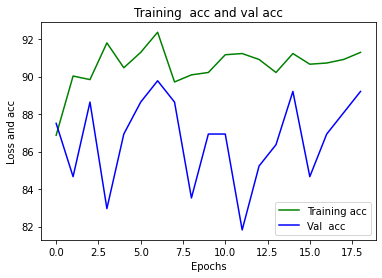

In [ ]:
plt.plot(epochs, trainacc[:19], 'g', label='Training acc')
plt.plot(epochs, valacc[:19], 'b', label='Val  acc')
plt.title('Training  acc and val acc')
plt.xlabel('Epochs')
plt.ylabel('Loss and acc')
plt.legend()
plt.show()

In [ ]:
import torch
import cv2
import glob as glob
import os
#from model import CustomCNN
from torchvision import transforms
checkpoint = torch.load(r"C:\Users\dhany\Downloads\Resnet-18-best-20sepslck\resnet18_best.pth", map_location=device)
print('Loading trained model weights...')
model.load_state_dict(checkpoint)
transform = transforms.Compose([
         transforms.ToPILImage(),
    #       transforms.Resize(256),
    # transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]) 

Loading trained model weights...


1
CleanPV-TEST-(21).jpg
CleanPV
CleanPV-TEST-(21).jpg
Output 0.4819653034210205
CleanPV


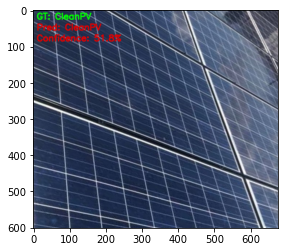

CleanPV-TEST-(22).jpg
CleanPV
CleanPV-TEST-(22).jpg
Output 0.4797622263431549
CleanPV


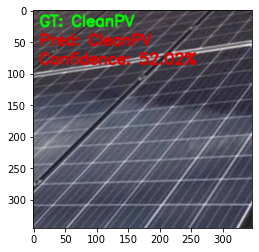

CleanPV-TEST-(23).jpg
CleanPV
CleanPV-TEST-(23).jpg
Output 0.5269293189048767
DirtyPV


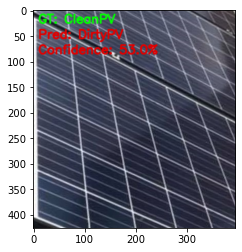

CleanPV-TEST-(24).jpg
CleanPV
CleanPV-TEST-(24).jpg
Output 0.537881076335907
DirtyPV


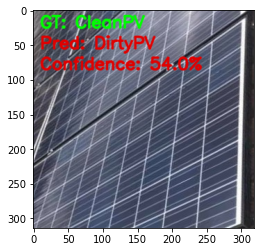

CleanPV-TEST-(25).jpg
CleanPV
CleanPV-TEST-(25).jpg
Output 0.5440647602081299
DirtyPV


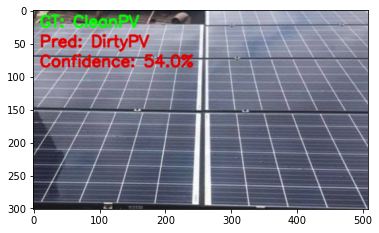

CleanPV-TEST-(26).jpg
CleanPV
CleanPV-TEST-(26).jpg
Output 0.47448229789733887
CleanPV


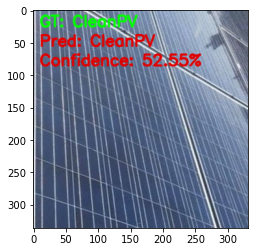

CleanPV-TEST-(27).jpg
CleanPV
CleanPV-TEST-(27).jpg
Output 0.4975075423717499
CleanPV


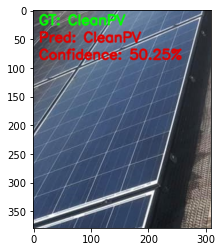

CleanPV-TEST-(28).jpg
CleanPV
CleanPV-TEST-(28).jpg
Output 0.4533471465110779
CleanPV


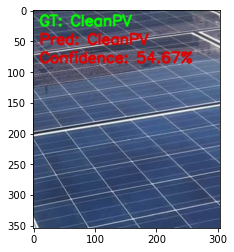

CleanPV-TEST-(29).jpg
CleanPV
CleanPV-TEST-(29).jpg
Output 0.4920719265937805
CleanPV


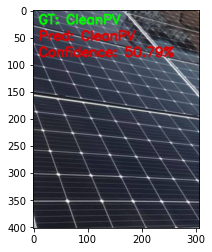

CleanPV-TEST-(3).jpg
CleanPV
CleanPV-TEST-(3).jpg
Output 0.5358396172523499
DirtyPV


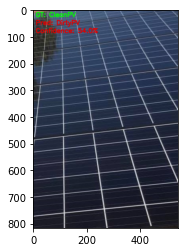

CleanPV-TEST-(30).jpg
CleanPV
CleanPV-TEST-(30).jpg
Output 0.516034722328186
DirtyPV


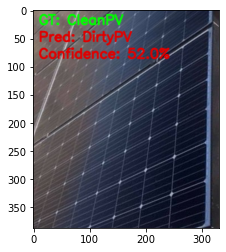

CleanPV-TEST-(31).jpg
CleanPV
CleanPV-TEST-(31).jpg
Output 0.47117143869400024
CleanPV


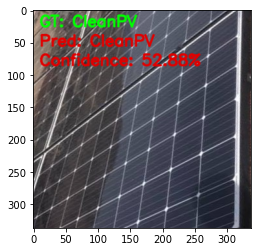

CleanPV-TEST-(32).jpg
CleanPV
CleanPV-TEST-(32).jpg
Output 0.5490213632583618
DirtyPV


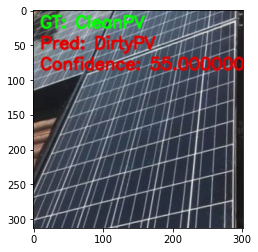

CleanPV-TEST-(33).jpg
CleanPV
CleanPV-TEST-(33).jpg
Output 0.5021546483039856
DirtyPV


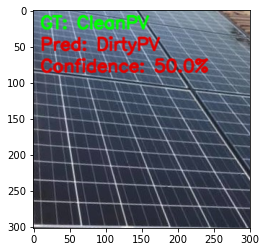

CleanPV-TEST-(34).jpg
CleanPV
CleanPV-TEST-(34).jpg
Output 0.5103570818901062
DirtyPV


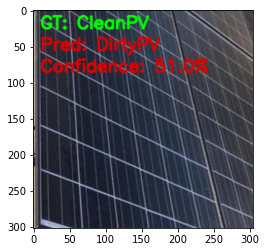

CleanPV-TEST-(35).jpg
CleanPV
CleanPV-TEST-(35).jpg
Output 0.49905282258987427
CleanPV


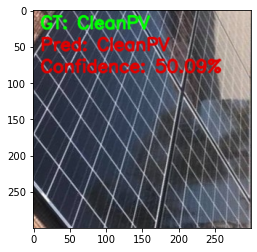

CleanPV-TEST-(36).jpg
CleanPV
CleanPV-TEST-(36).jpg
Output 0.49834123253822327
CleanPV


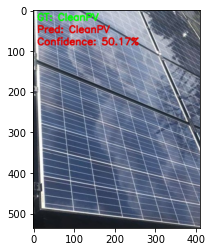

CleanPV-TEST-(37).jpg
CleanPV
CleanPV-TEST-(37).jpg
Output 0.4680625796318054
CleanPV


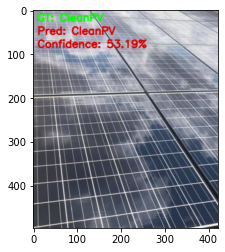

CleanPV-TEST-(38).jpg
CleanPV
CleanPV-TEST-(38).jpg
Output 0.5001655220985413
DirtyPV


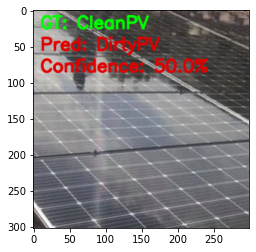

CleanPV-TEST-(39).jpg
CleanPV
CleanPV-TEST-(39).jpg
Output 0.5272946357727051
DirtyPV


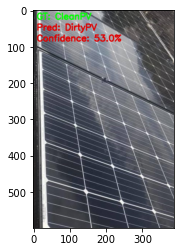

CleanPV-TEST-(4).jpg
CleanPV
CleanPV-TEST-(4).jpg
Output 0.5262226462364197
DirtyPV


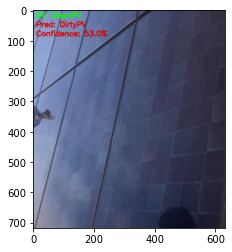

CleanPV-TEST-(40).jpg
CleanPV
CleanPV-TEST-(40).jpg
Output 0.4888545870780945
CleanPV


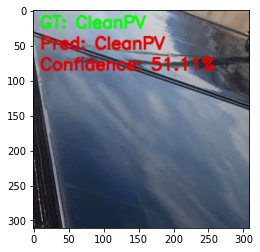

CleanPV-TEST-(41).jpg
CleanPV
CleanPV-TEST-(41).jpg
Output 0.5868434309959412
DirtyPV


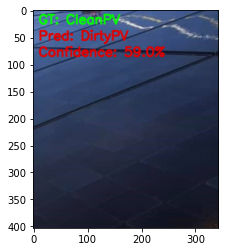

CleanPV-TEST-(42).jpg
CleanPV
CleanPV-TEST-(42).jpg
Output 0.5003027319908142
DirtyPV


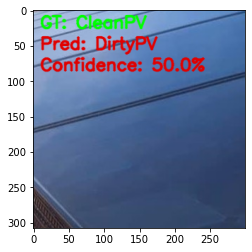

CleanPV-TEST-(43).jpg
CleanPV
CleanPV-TEST-(43).jpg
Output 0.49761828780174255
CleanPV


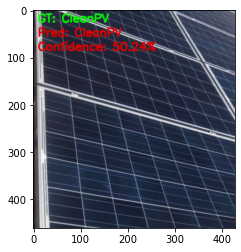

CleanPV-TEST-(44).jpg
CleanPV
CleanPV-TEST-(44).jpg
Output 0.5590165257453918
DirtyPV


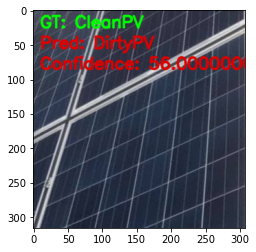

CleanPV-TEST-(46).jpg
CleanPV
CleanPV-TEST-(46).jpg
Output 0.5720521807670593
DirtyPV


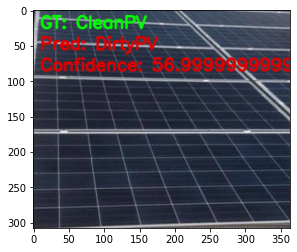

CleanPV-TEST-(47).jpg
CleanPV
CleanPV-TEST-(47).jpg
Output 0.52008455991745
DirtyPV


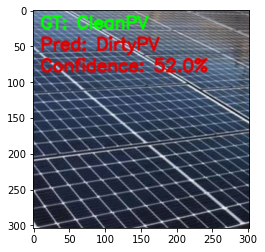

CleanPV-TEST-(48).jpg
CleanPV
CleanPV-TEST-(48).jpg
Output 0.5695664882659912
DirtyPV


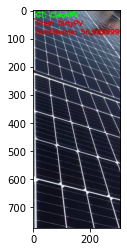

CleanPV-TEST-(49).jpg
CleanPV
CleanPV-TEST-(49).jpg
Output 0.5206949710845947
DirtyPV


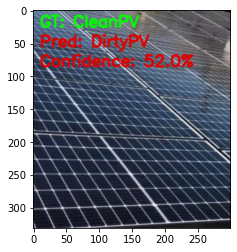

CleanPV-TEST-(5).jpg
CleanPV
CleanPV-TEST-(5).jpg
Output 0.4964599311351776
CleanPV


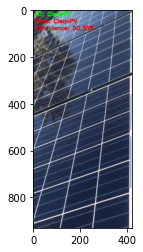

CleanPV-TEST-(50).jpg
CleanPV
CleanPV-TEST-(50).jpg
Output 0.44614019989967346
CleanPV


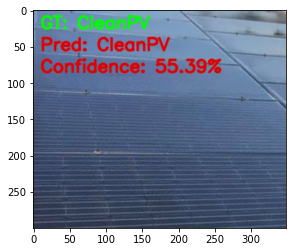

CleanPV-TEST-(51).jpg
CleanPV
CleanPV-TEST-(51).jpg
Output 0.4749698042869568
CleanPV


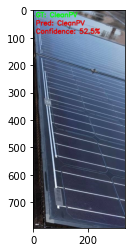

CleanPV-TEST-(52).jpg
CleanPV
CleanPV-TEST-(52).jpg
Output 0.4932052195072174
CleanPV


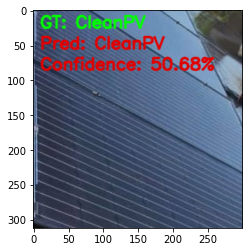

CleanPV-TEST-(54).jpg
CleanPV
CleanPV-TEST-(54).jpg
Output 0.553293764591217
DirtyPV


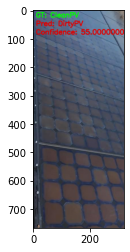

CleanPV-TEST-(55).jpg
CleanPV
CleanPV-TEST-(55).jpg
Output 0.40105095505714417
CleanPV


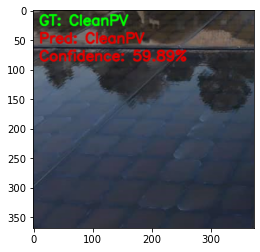

CleanPV-TEST-(56).jpg
CleanPV
CleanPV-TEST-(56).jpg
Output 0.448920875787735
CleanPV


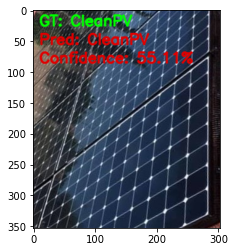

CleanPV-TEST-(57).jpg
CleanPV
CleanPV-TEST-(57).jpg
Output 0.5521655082702637
DirtyPV


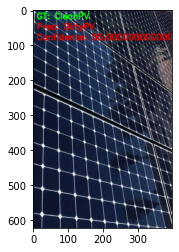

CleanPV-TEST-(58).jpg
CleanPV
CleanPV-TEST-(58).jpg
Output 0.4759625792503357
CleanPV


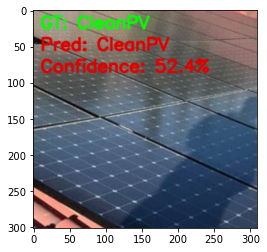

CleanPV-TEST-(59).jpg
CleanPV
CleanPV-TEST-(59).jpg
Output 0.46055442094802856
CleanPV


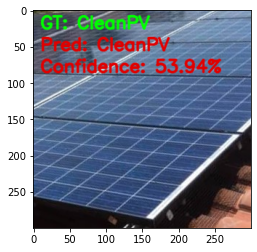

CleanPV-TEST-(6).jpg
CleanPV
CleanPV-TEST-(6).jpg
Output 0.5532195568084717
DirtyPV


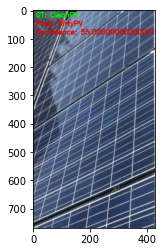

CleanPV-TEST-(60).jpg
CleanPV
CleanPV-TEST-(60).jpg
Output 0.5083789229393005
DirtyPV


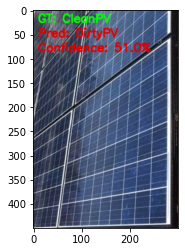

CleanPV-TEST-(61).jpg
CleanPV
CleanPV-TEST-(61).jpg
Output 0.5369899868965149
DirtyPV


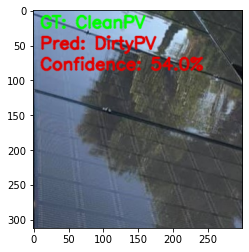

CleanPV-TEST-(62).jpg
CleanPV
CleanPV-TEST-(62).jpg
Output 0.5844401717185974
DirtyPV


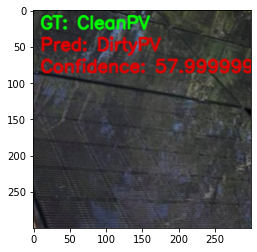

CleanPV-TEST-(63).jpg
CleanPV
CleanPV-TEST-(63).jpg
Output 0.5284489393234253
DirtyPV


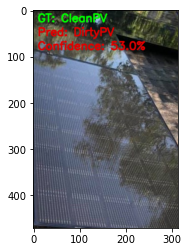

CleanPV-TEST-(64).jpg
CleanPV
CleanPV-TEST-(64).jpg
Output 0.4918269217014313
CleanPV


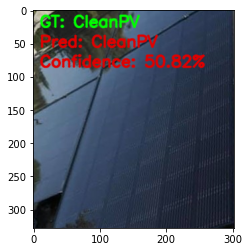

CleanPV-TEST-(65).jpg
CleanPV
CleanPV-TEST-(65).jpg
Output 0.49584802985191345
CleanPV


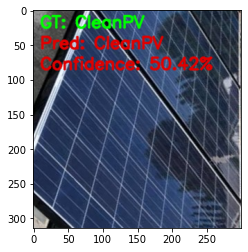

CleanPV-TEST-(66).jpg
CleanPV
CleanPV-TEST-(66).jpg
Output 0.45793813467025757
CleanPV


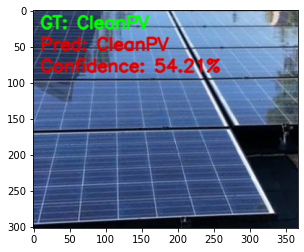

CleanPV-TEST-(67).jpg
CleanPV
CleanPV-TEST-(67).jpg
Output 0.49897119402885437
CleanPV


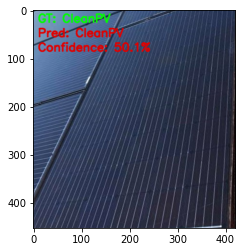

CleanPV-TEST-(68).jpg
CleanPV
CleanPV-TEST-(68).jpg
Output 0.4993811249732971
CleanPV


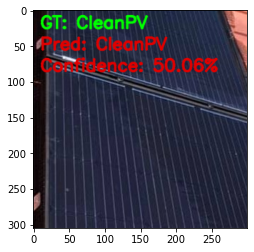

CleanPV-TEST-(69).jpg
CleanPV
CleanPV-TEST-(69).jpg
Output 0.4848167598247528
CleanPV


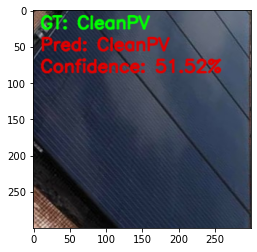

CleanPV-TEST-(7).jpg
CleanPV
CleanPV-TEST-(7).jpg
Output 0.4933726489543915
CleanPV


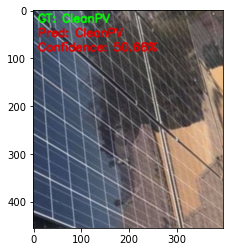

CleanPV-TEST-(70).jpg
CleanPV
CleanPV-TEST-(70).jpg
Output 0.5966983437538147
DirtyPV


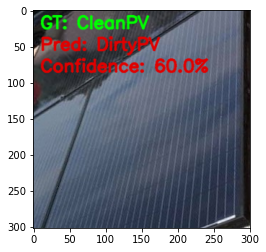

CleanPV-TEST-(71).jpg
CleanPV
CleanPV-TEST-(71).jpg
Output 0.4636951684951782
CleanPV


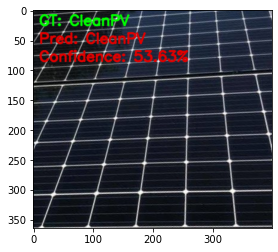

CleanPV-TEST-(72).jpg
CleanPV
CleanPV-TEST-(72).jpg
Output 0.558100163936615
DirtyPV


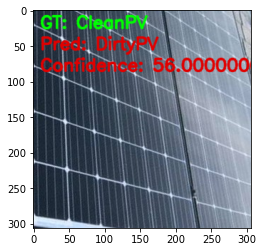

CleanPV-TEST-(73).jpg
CleanPV
CleanPV-TEST-(73).jpg
Output 0.5359586477279663
DirtyPV


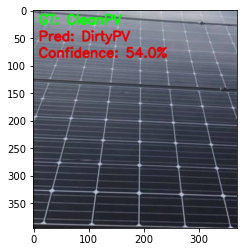

CleanPV-TEST-(74).jpg
CleanPV
CleanPV-TEST-(74).jpg
Output 0.5023301839828491
DirtyPV


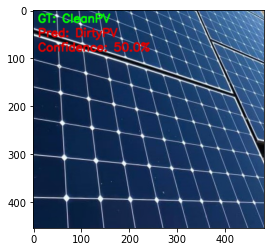

CleanPV-TEST-(75).jpg
CleanPV
CleanPV-TEST-(75).jpg
Output 0.49698230624198914
CleanPV


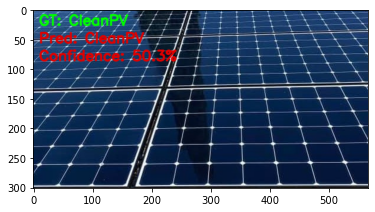

CleanPV-TEST-(76).jpg
CleanPV
CleanPV-TEST-(76).jpg
Output 0.5357595086097717
DirtyPV


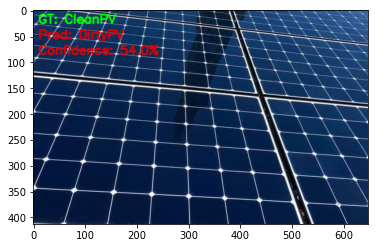

CleanPV-TEST-(8).jpg
CleanPV
CleanPV-TEST-(8).jpg
Output 0.5461267232894897
DirtyPV


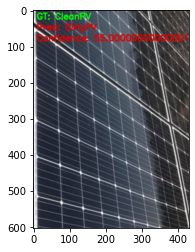

CleanPV-TEST-(9).jpg
CleanPV
CleanPV-TEST-(9).jpg
Output 0.5447004437446594
DirtyPV


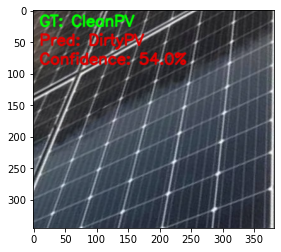

DirtyPV-TEST-(1).jpg
DirtyPV
DirtyPV-TEST-(1).jpg
Output 0.5223842263221741
DirtyPV


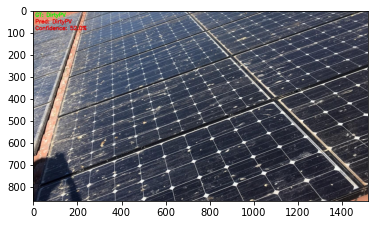

DirtyPV-TEST-(10).jpg
DirtyPV
DirtyPV-TEST-(10).jpg
Output 0.5526013374328613
DirtyPV


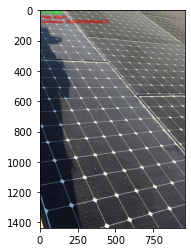

DirtyPV-TEST-(100).jpg
DirtyPV
DirtyPV-TEST-(100).jpg
Output 0.5631483197212219
DirtyPV


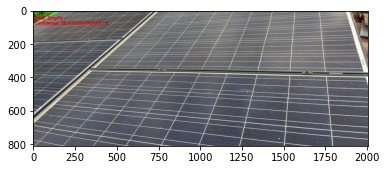

DirtyPV-TEST-(12).jpg
DirtyPV
DirtyPV-TEST-(12).jpg
Output 0.47614994645118713
CleanPV


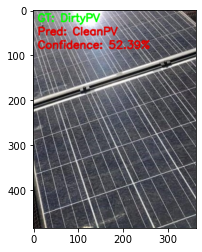

DirtyPV-TEST-(13).jpg
DirtyPV
DirtyPV-TEST-(13).jpg
Output 0.516692578792572
DirtyPV


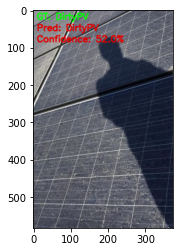

DirtyPV-TEST-(14).jpg
DirtyPV
DirtyPV-TEST-(14).jpg
Output 0.5373775362968445
DirtyPV


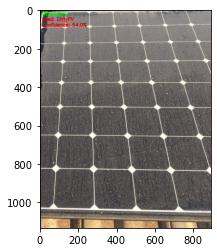

DirtyPV-TEST-(15).jpg
DirtyPV
DirtyPV-TEST-(15).jpg
Output 0.5595526099205017
DirtyPV


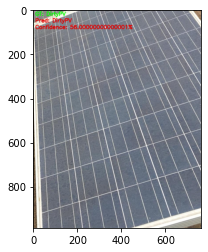

DirtyPV-TEST-(17).jpg
DirtyPV
DirtyPV-TEST-(17).jpg
Output 0.5559073090553284
DirtyPV


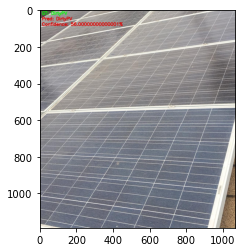

DirtyPV-TEST-(18).jpg
DirtyPV
DirtyPV-TEST-(18).jpg
Output 0.5345754623413086
DirtyPV


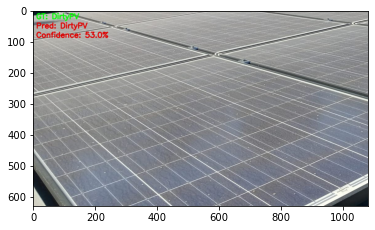

DirtyPV-TEST-(19).jpg
DirtyPV
DirtyPV-TEST-(19).jpg
Output 0.5197765231132507
DirtyPV


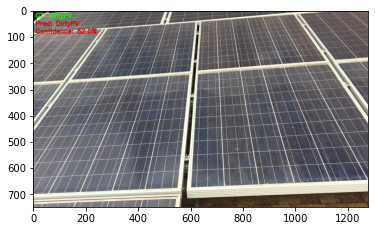

DirtyPV-TEST-(2).jpg
DirtyPV
DirtyPV-TEST-(2).jpg
Output 0.5513357520103455
DirtyPV


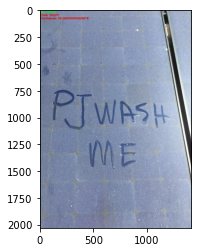

DirtyPV-TEST-(20).jpg
DirtyPV
DirtyPV-TEST-(20).jpg
Output 0.5404855608940125
DirtyPV


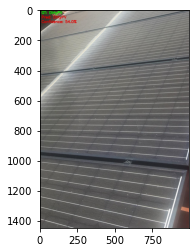

DirtyPV-TEST-(21).jpg
DirtyPV
DirtyPV-TEST-(21).jpg
Output 0.5554086565971375
DirtyPV


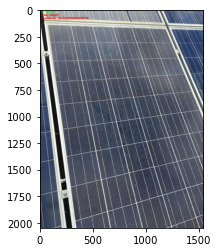

DirtyPV-TEST-(22).jpg
DirtyPV
DirtyPV-TEST-(22).jpg
Output 0.5352126955986023
DirtyPV


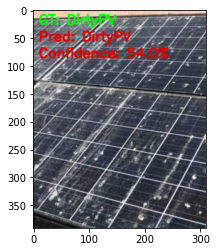

DirtyPV-TEST-(23).jpg
DirtyPV
DirtyPV-TEST-(23).jpg
Output 0.5544828176498413
DirtyPV


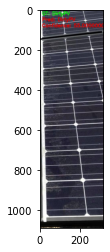

DirtyPV-TEST-(24).jpg
DirtyPV
DirtyPV-TEST-(24).jpg
Output 0.5073444247245789
DirtyPV


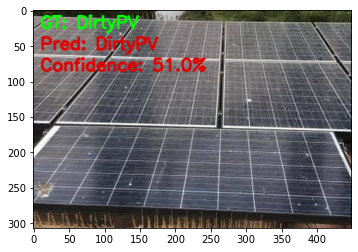

DirtyPV-TEST-(25).jpg
DirtyPV
DirtyPV-TEST-(25).jpg
Output 0.45920640230178833
CleanPV


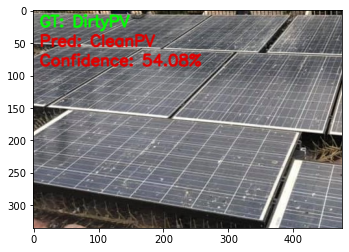

DirtyPV-TEST-(26).jpg
DirtyPV
DirtyPV-TEST-(26).jpg
Output 0.488153874874115
CleanPV


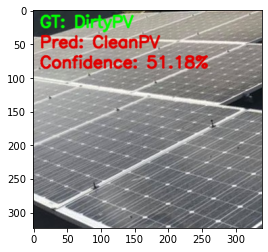

DirtyPV-TEST-(27).jpg
DirtyPV
DirtyPV-TEST-(27).jpg
Output 0.5898759365081787
DirtyPV


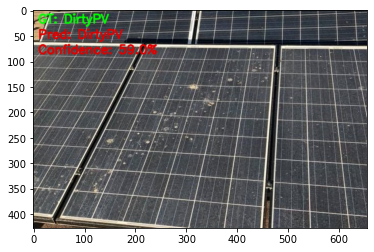

DirtyPV-TEST-(28).jpg
DirtyPV
DirtyPV-TEST-(28).jpg
Output 0.5291093587875366
DirtyPV


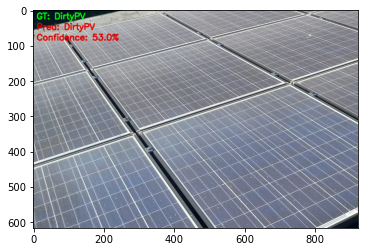

DirtyPV-TEST-(29).jpg
DirtyPV
DirtyPV-TEST-(29).jpg
Output 0.49470794200897217
CleanPV


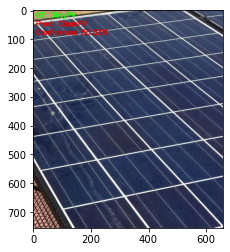

DirtyPV-TEST-(3).jpg
DirtyPV
DirtyPV-TEST-(3).jpg
Output 0.5192112922668457
DirtyPV


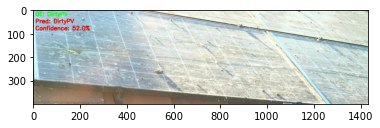

DirtyPV-TEST-(30).jpg
DirtyPV
DirtyPV-TEST-(30).jpg
Output 0.5079569816589355
DirtyPV


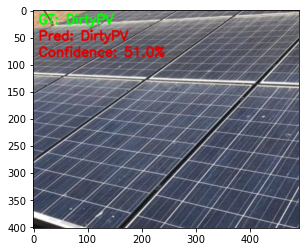

DirtyPV-TEST-(31).jpg
DirtyPV
DirtyPV-TEST-(31).jpg
Output 0.46870896220207214
CleanPV


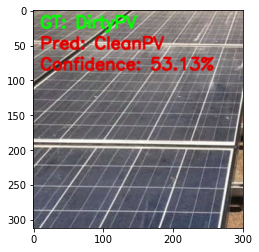

DirtyPV-TEST-(32).jpg
DirtyPV
DirtyPV-TEST-(32).jpg
Output 0.545648455619812
DirtyPV


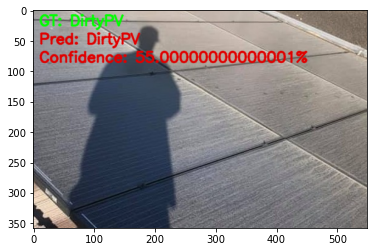

DirtyPV-TEST-(33).jpg
DirtyPV
DirtyPV-TEST-(33).jpg
Output 0.4898241460323334
CleanPV


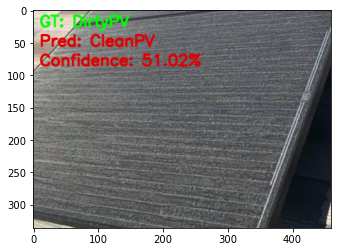

DirtyPV-TEST-(34).jpg
DirtyPV
DirtyPV-TEST-(34).jpg
Output 0.5007487535476685
DirtyPV


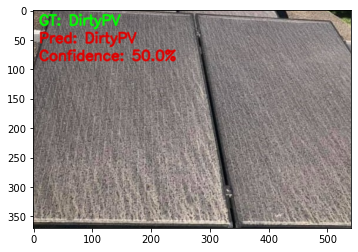

DirtyPV-TEST-(35).jpg
DirtyPV
DirtyPV-TEST-(35).jpg
Output 0.5518267154693604
DirtyPV


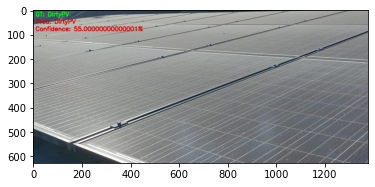

DirtyPV-TEST-(36).jpg
DirtyPV
DirtyPV-TEST-(36).jpg
Output 0.5374715924263
DirtyPV


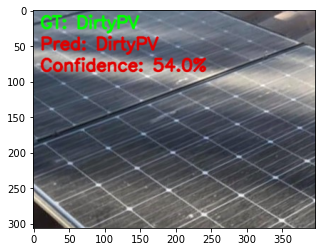

DirtyPV-TEST-(37).jpg
DirtyPV
DirtyPV-TEST-(37).jpg
Output 0.5170191526412964
DirtyPV


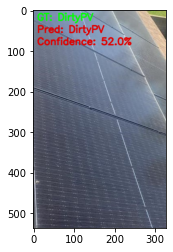

DirtyPV-TEST-(38).jpg
DirtyPV
DirtyPV-TEST-(38).jpg
Output 0.4546085596084595
CleanPV


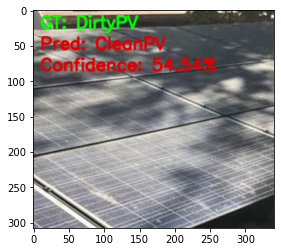

DirtyPV-TEST-(39).jpg
DirtyPV
DirtyPV-TEST-(39).jpg
Output 0.5407969355583191
DirtyPV


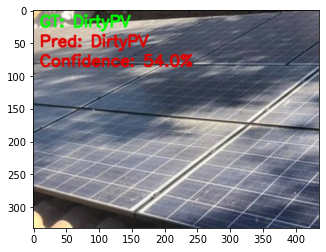

DirtyPV-TEST-(4).jpg
DirtyPV
DirtyPV-TEST-(4).jpg
Output 0.5307256579399109
DirtyPV


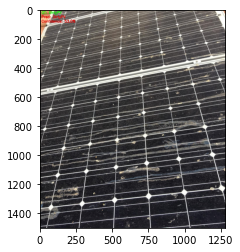

DirtyPV-TEST-(40).jpg
DirtyPV
DirtyPV-TEST-(40).jpg
Output 0.4675373136997223
CleanPV


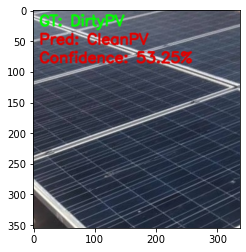

DirtyPV-TEST-(41).jpg
DirtyPV
DirtyPV-TEST-(41).jpg
Output 0.5012808442115784
DirtyPV


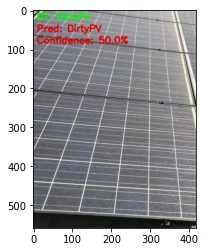

DirtyPV-TEST-(42).jpg
DirtyPV
DirtyPV-TEST-(42).jpg
Output 0.5288008451461792
DirtyPV


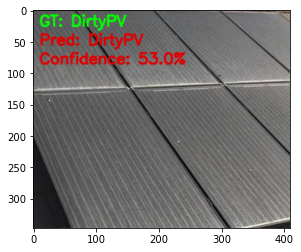

DirtyPV-TEST-(43).jpg
DirtyPV
DirtyPV-TEST-(43).jpg
Output 0.5425670146942139
DirtyPV


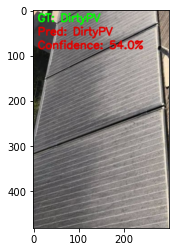

DirtyPV-TEST-(44).jpg
DirtyPV
DirtyPV-TEST-(44).jpg
Output 0.5013493299484253
DirtyPV


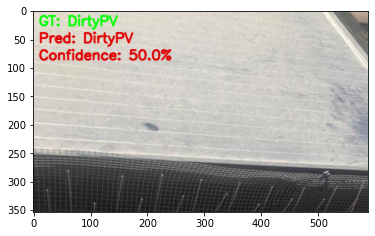

DirtyPV-TEST-(46).jpg
DirtyPV
DirtyPV-TEST-(46).jpg
Output 0.5074375867843628
DirtyPV


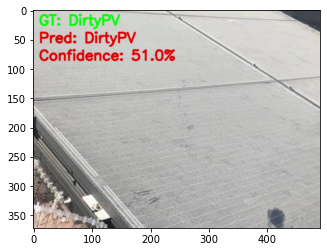

DirtyPV-TEST-(47).jpg
DirtyPV
DirtyPV-TEST-(47).jpg
Output 0.4789201319217682
CleanPV


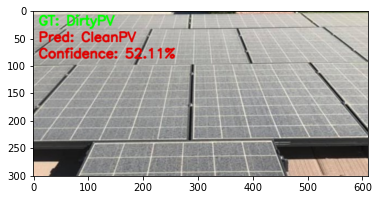

DirtyPV-TEST-(48).jpg
DirtyPV
DirtyPV-TEST-(48).jpg
Output 0.5344059467315674
DirtyPV


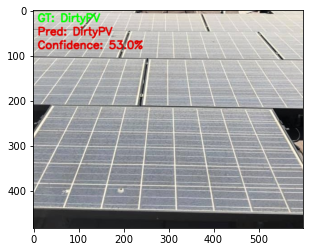

DirtyPV-TEST-(49).jpg
DirtyPV
DirtyPV-TEST-(49).jpg
Output 0.5053171515464783
DirtyPV


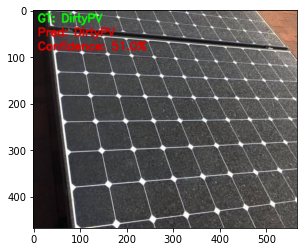

DirtyPV-TEST-(5).jpg
DirtyPV
DirtyPV-TEST-(5).jpg
Output 0.5341615080833435
DirtyPV


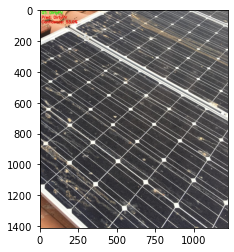

DirtyPV-TEST-(50).jpg
DirtyPV
DirtyPV-TEST-(50).jpg
Output 0.4748290777206421
CleanPV


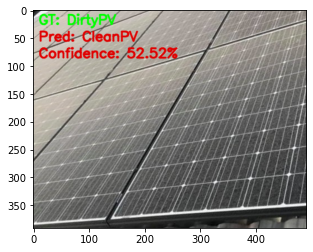

DirtyPV-TEST-(52).jpg
DirtyPV
DirtyPV-TEST-(52).jpg
Output 0.5479942560195923
DirtyPV


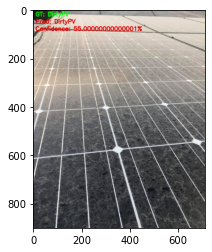

DirtyPV-TEST-(53).jpg
DirtyPV
DirtyPV-TEST-(53).jpg
Output 0.5533758401870728
DirtyPV


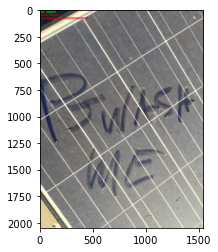

DirtyPV-TEST-(54).jpg
DirtyPV
DirtyPV-TEST-(54).jpg
Output 0.5471155643463135
DirtyPV


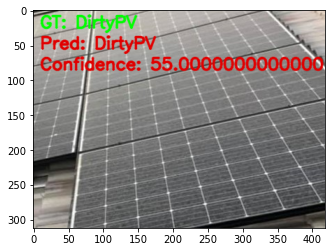

DirtyPV-TEST-(55).jpg
DirtyPV
DirtyPV-TEST-(55).jpg
Output 0.5098168253898621
DirtyPV


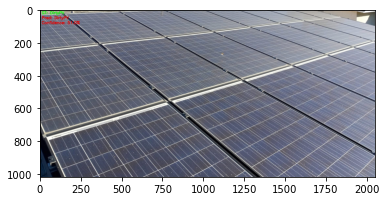

DirtyPV-TEST-(56).jpg
DirtyPV
DirtyPV-TEST-(56).jpg
Output 0.5554355978965759
DirtyPV


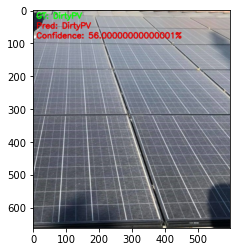

DirtyPV-TEST-(57).jpg
DirtyPV
DirtyPV-TEST-(57).jpg
Output 0.4657149612903595
CleanPV


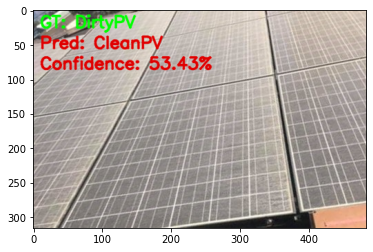

DirtyPV-TEST-(58).jpg
DirtyPV
DirtyPV-TEST-(58).jpg
Output 0.534446656703949
DirtyPV


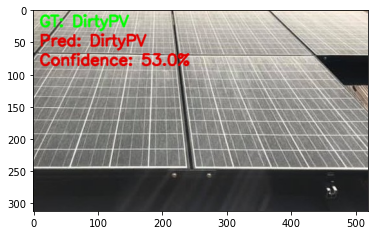

DirtyPV-TEST-(59).jpg
DirtyPV
DirtyPV-TEST-(59).jpg
Output 0.49741992354393005
CleanPV


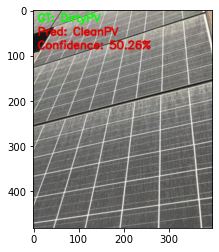

DirtyPV-TEST-(6).jpg
DirtyPV
DirtyPV-TEST-(6).jpg
Output 0.5267747044563293
DirtyPV


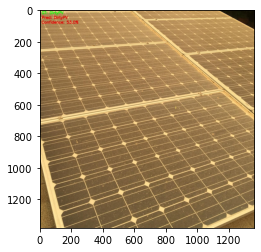

DirtyPV-TEST-(60).jpg
DirtyPV
DirtyPV-TEST-(60).jpg
Output 0.52447909116745
DirtyPV


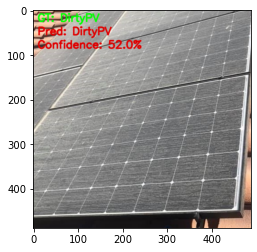

DirtyPV-TEST-(61).jpg
DirtyPV
DirtyPV-TEST-(61).jpg
Output 0.537670373916626
DirtyPV


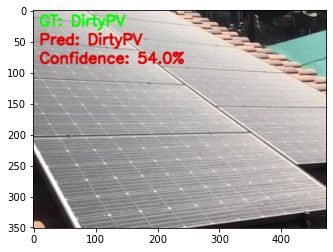

DirtyPV-TEST-(62).jpg
DirtyPV
DirtyPV-TEST-(62).jpg
Output 0.5516148805618286
DirtyPV


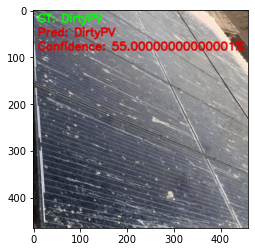

DirtyPV-TEST-(64).jpg
DirtyPV
DirtyPV-TEST-(64).jpg
Output 0.5491956472396851
DirtyPV


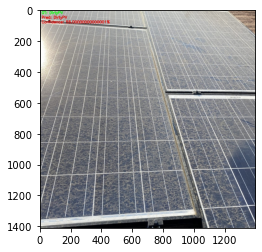

DirtyPV-TEST-(65).jpg
DirtyPV
DirtyPV-TEST-(65).jpg
Output 0.5623181462287903
DirtyPV


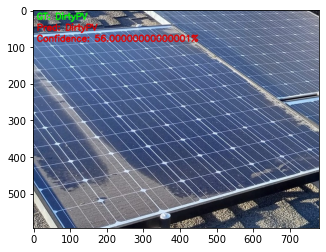

DirtyPV-TEST-(66).jpg
DirtyPV
DirtyPV-TEST-(66).jpg
Output 0.5297362804412842
DirtyPV


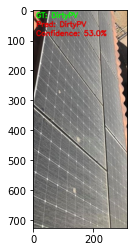

DirtyPV-TEST-(67).jpg
DirtyPV
DirtyPV-TEST-(67).jpg
Output 0.5834500789642334
DirtyPV


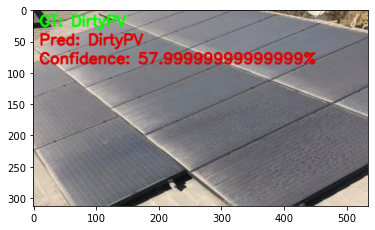

DirtyPV-TEST-(68).jpg
DirtyPV
DirtyPV-TEST-(68).jpg
Output 0.49694502353668213
CleanPV


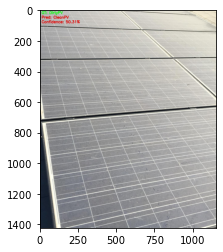

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
63.114754098360656


In [ ]:
#from google.colab.patches import cv2_imshow
from numpy import argmax
# Get all the test image paths.
print(1)
all_image_paths =r"C:\Users\dhany\Downloads\solar-panels-dusty\DirtyAndClean-Test-20220921T174604Z-001\DirtyAndClean-Test"
# Iterate over all the images and do forward pass.
pred_list=[]
true_list = []
for image_path in os.listdir(all_image_paths)[9:131]:
    print(image_path)
    # Get the ground truth class name like 'CleanPV' from the image path.
    gt_class_name = image_path.split('-')[0]
    # gt_class_name = image_path.split(
    #     os.path.sep
    # )[-1].split('.')[0].split('_')[0]
    if gt_class_name == 'CleanPV':
      true_list.append(0)
    else:
       true_list.append(1)



    print(gt_class_name)
    print(image_path)
    # Read the image and create a copy.
    image = cv2.imread(all_image_paths+'//'+image_path)
    orig_image = image.copy()
    
    # Preprocess the image.
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    image = transform(image)
    image = torch.unsqueeze(image, 0)
    image = image.to(device)
   # input_batch = image.unsqueeze(0)
    # Forward pass throught the image.
  #   with torch.no_grad():
    model.to(device)
    outputs = model(image)
    
    print('Output', outputs[0,0].item())
    pred_class_name = 'DirtyPV' if outputs[0,0].item() >=0.5 else 'CleanPV'
    print(pred_class_name)
    pred_list.append(outputs[0,0].item())
    # top5_prob, top5_catid = torch.topk(probabilities, 2)
    # categories = ['Clean', 'Dirty']
    # for i in range(top5_prob.size(0)):
    #   print(categories[top5_catid[i]], top5_prob[i].item())
   # print(f"GT: {gt_class_name}, Pred: {pred_class_name.lower()}")
    # Annotate the image with ground truth.
    cv2.putText(
        orig_image, f"GT: {gt_class_name}",
        (10, 25), cv2.FONT_HERSHEY_SIMPLEX,
        0.8, (0, 255, 0), 2, lineType=cv2.LINE_AA
    )
    # Annotate the image with prediction.
    cv2.putText(
        orig_image, f"Pred: {pred_class_name}",
        (10, 55), cv2.FONT_HERSHEY_SIMPLEX,
        0.8, (0, 0, 225), 2, lineType=cv2.LINE_AA
    ) 
    
    cv2.putText(
        orig_image, f"Confidence: {str(round(outputs[0,0].item(),2)*100)+'%' if outputs[0,0].item() >=0.5 else str((round((1-outputs[0,0].item())*100, 2)))+'%'}",
        (10, 85), cv2.FONT_HERSHEY_SIMPLEX,
        0.8, (0, 0, 225), 2, lineType=cv2.LINE_AA
    ) 
    fig, ax = plt.subplots()
    orig_image = image = cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB)
    img = ax.imshow(orig_image)
    
    plt.show()
#     cv2.imshow('1', orig_image)
    
#     print(gt_class_name)
    
#     cv2.waitKey(0)
#     cv2.imwrite(
#         f"C:/Users/dhany/Downloads/solar-panels-dusty\DirtyAndClean-Test-20220921T174604Z-001/outputs/{image_path.split('.')[0]}.png",
#         orig_image)

print(true_list)
print(accuracy(pred_list, true_list))

[[29 32]
 [13 48]]
0:CleanPV
1:DirtyPV
              precision    recall  f1-score   support

           0       0.69      0.48      0.56        61
           1       0.60      0.79      0.68        61

    accuracy                           0.63       122
   macro avg       0.65      0.63      0.62       122
weighted avg       0.65      0.63      0.62       122



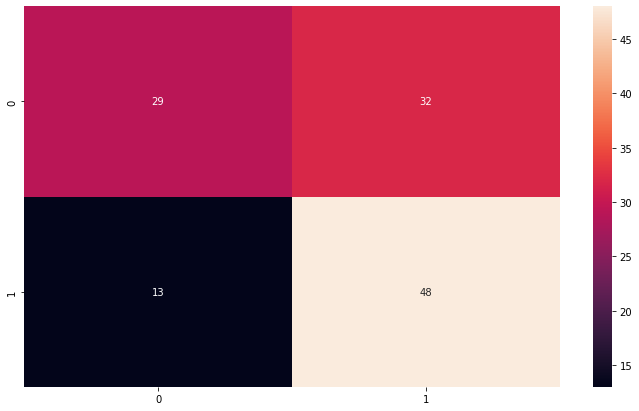

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

y_pred = []
y_true = []


# constant for classes
classes = ('CleanPV', 'DirtyPV')
for i in pred_list:
  if i >= 0.5:
      y_pred.append(1)
  else:
       y_pred.append(0)
# Build confusion matrix
cf_matrix = confusion_matrix(true_list, y_pred)
df_cm = pd.DataFrame(cf_matrix/np.sum(cf_matrix) *10, index = [i for i in classes],
                     columns = [i for i in classes])
print(cf_matrix)
plt.figure(figsize = (12,7))
sn.heatmap(cf_matrix, annot=True)
plt.savefig('output.png')
print('0:CleanPV')
print('1:DirtyPV')


   # print('Confusion Matrix:\n',metrics.confusion_matrix(true, pred))
   # print('Precision: {} Recall: {}, Accuracy: {}: ,f1_score: {}'.format(precision*100,recall*100,accuracy*100,f1_score*100))
from sklearn.metrics import classification_report
#print(classification_report(np.array(true_list, dtype=np.float32),np.array(pred_list, dtype=np.float32)))
print(classification_report(true_list, y_pred))